In [2]:
import os
import re
from pathlib import Path
import yaml

import anndata
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import scanpy.external as sce
import pandas as pd

In [3]:
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42
plt.rcParams['svg.fonttype'] = 'none'

In [4]:
%load_ext autoreload

In [5]:
%autoreload 2

In [6]:
import mushroom.utils as utils
import mushroom.visualization.utils as vis_utils
from mushroom.mushroom import Mushroom

HT206B1 batches

- 1, 9, 17
- 8, 16, 24

In [7]:
# case = 'HT206B1'
case = 'HT413C1-Th1k4A1'

In [8]:
project_dir = '/data/estorrs/mushroom/data/projects/submission_v1'
output_dir = os.path.join(project_dir, case, 'cosmx_cell_typing')
Path(output_dir).mkdir(parents=True, exist_ok=True)

In [9]:
def alter_filesystem(config, source_root, target_root):
    for entry in config['sections']:
        for mapping in entry['data']:
            mapping['filepath'] = mapping['filepath'].replace(source_root, target_root)
    
    if 'trainer_kwargs' in config and config['trainer_kwargs']['data_mask'] is not None:
        config['trainer_kwargs']['data_mask'] = config['trainer_kwargs']['data_mask'].replace(source_root, target_root)
        
    return config

source_root = '/diskmnt/Projects/Users/estorrs/mushroom/data'
target_root = '/data/estorrs/mushroom/data'

In [10]:
sections = yaml.safe_load(open(os.path.join(project_dir, case, 'mushroom_50res', 'config.yaml')))['sections']
sections

[{'data': [{'dtype': 'he',
    'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT413C1-Th1k4A1/registered/s0_HT413C1-Th1k4A1-U14_he.tif'}],
  'position': 0,
  'sid': 'HT413C1-Th1k4A1-U14'},
 {'data': [{'dtype': 'he',
    'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT413C1-Th1k4A1/registered/s1_HT413C1-Th1k4A1-U18_he.tif'}],
  'position': 20,
  'sid': 'HT413C1-Th1k4A1-U18'},
 {'data': [{'dtype': 'xenium',
    'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT413C1-Th1k4A1/registered/s2_HT413C1-Th1k4A1-U19_xenium.h5ad'}],
  'position': 25,
  'sid': 'HT413C1-Th1k4A1-U19'},
 {'data': [{'dtype': 'multiplex',
    'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT413C1-Th1k4A1/registered/s3_HT413C1-Th1k4A1-U20_multiplex.ome.tiff'}],
  'position': 30,
  'sid': 'HT413C1-Th1k4A1-U20'},
 {'data': [{'dtype': 'he',
    'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT413C1-Th1k4A1/registered/s4_HT413C1-Th1k4A1-U1_h

In [10]:
sid_to_fps = {}
for entry in sections:
    uid = entry['sid'].split('-')[-1]
    for mapping in entry['data']:
        if mapping['dtype'] == 'cosmx':
            sid_to_fps[entry['sid']] = mapping['filepath']
sid_to_fps

{'HT413C1-Th1k4A1-U7': '/data/estorrs/mushroom/data/projects/submission_v1/HT413C1-Th1k4A1/registered/s8_HT413C1-Th1k4A1-U7_cosmx.h5ad',
 'HT413C1-Th1k4A1-U34': '/data/estorrs/mushroom/data/projects/submission_v1/HT413C1-Th1k4A1/registered/s21_HT413C1-Th1k4A1-U34_cosmx.h5ad'}

In [11]:
sid_to_adata = {}
for sid, fp in sid_to_fps.items():
    a = sc.read_h5ad(fp) 
    print(a.shape)
    a.obs['sid'] = sid
    a.obs.index = [f'{sid}_{x}' for x in a.obs.index.to_list()]
    sid_to_adata[sid] = a

(73874, 1000)
(53858, 1000)


In [12]:
adata = anndata.concat(sid_to_adata.values())
adata

AnnData object with n_obs × n_vars = 127732 × 1000
    obs: 'nn_fe6192eb.42e5.4fe7.bb87.3f135ac419e1_1_cluster_cluster_0e369590.6582.4f98.888c.31c1e1e79bd2_1', 'nCount_RNA', 'nFeature_RNA', 'nCount_negprobes', 'nFeature_negprobes', 'nn_62902f34.ea2c.4493.a837.18d22e3fcf4e_1_cluster_cluster_1d82bfd6.0c18.43d8.9333.c51e3a80d0bc_1', 'RNA_nbclust_099edabb.2194.47e8.ac53.3b0bba1aff79_1_clusters', 'RNA_nbclust_099edabb.2194.47e8.ac53.3b0bba1aff79_1_posterior_probability', 'fov', 'Area', 'AspectRatio', 'Width', 'Height', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD68', 'Max.CD68', 'Mean.Membrane', 'Max.Membrane', 'Mean.CD45', 'Max.CD45', 'Mean.DAPI', 'Max.DAPI', 'cell_id', 'assay_type', 'version', 'Run_Tissue_name', 'Panel', 'slide_ID', 'cell_ID', 'unassignedTranscripts', 'nCount_falsecode', 'nFeature_falsecode', 'Area.um2', 'CenterX_local_px', 'CenterY_local_px', 'CenterX_global_px', 'CenterY_global_px', 'propNegative', 'complexity', 'errorCtEstimate', 'percOfDataFromError', 'qcFlagsRNACounts', 'qcFl

In [13]:
sc.pp.filter_cells(adata, min_counts=10)
sc.pp.filter_genes(adata, min_cells=5)
adata

AnnData object with n_obs × n_vars = 121291 × 1000
    obs: 'nn_fe6192eb.42e5.4fe7.bb87.3f135ac419e1_1_cluster_cluster_0e369590.6582.4f98.888c.31c1e1e79bd2_1', 'nCount_RNA', 'nFeature_RNA', 'nCount_negprobes', 'nFeature_negprobes', 'nn_62902f34.ea2c.4493.a837.18d22e3fcf4e_1_cluster_cluster_1d82bfd6.0c18.43d8.9333.c51e3a80d0bc_1', 'RNA_nbclust_099edabb.2194.47e8.ac53.3b0bba1aff79_1_clusters', 'RNA_nbclust_099edabb.2194.47e8.ac53.3b0bba1aff79_1_posterior_probability', 'fov', 'Area', 'AspectRatio', 'Width', 'Height', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD68', 'Max.CD68', 'Mean.Membrane', 'Max.Membrane', 'Mean.CD45', 'Max.CD45', 'Mean.DAPI', 'Max.DAPI', 'cell_id', 'assay_type', 'version', 'Run_Tissue_name', 'Panel', 'slide_ID', 'cell_ID', 'unassignedTranscripts', 'nCount_falsecode', 'nFeature_falsecode', 'Area.um2', 'CenterX_local_px', 'CenterY_local_px', 'CenterX_global_px', 'CenterY_global_px', 'propNegative', 'complexity', 'errorCtEstimate', 'percOfDataFromError', 'qcFlagsRNACounts', 'qcFl

In [14]:
adata.layers["counts"] = adata.X.copy()
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
sc.pp.pca(adata)

In [ ]:
sce.pp.harmony_integrate(adata, 'sid')

2024-05-02 16:52:08,825 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/joblib/externals/loky/backend/context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
[Errno 13] Permission denied: 'lscpu'
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/joblib/externals/loky/backend/context.py", line 250, in _count_physical_cores
    cpu_info = subprocess.run(
  File "/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/subprocess.py", line 503, in run
    with Popen(*popenargs, **kwargs) as process:
  File "/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/subprocess.py", line 971, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  File "/dat

In [16]:
sc.pp.neighbors(adata, use_rep='X_pca_harmony')
sc.tl.umap(adata)

In [12]:
sc.tl.leiden(adata, resolution=3.)

In [11]:
adata = sc.read_h5ad(os.path.join(output_dir, 'cell_typing_obj.h5ad'))
adata

AnnData object with n_obs × n_vars = 121291 × 1000
    obs: 'nn_fe6192eb.42e5.4fe7.bb87.3f135ac419e1_1_cluster_cluster_0e369590.6582.4f98.888c.31c1e1e79bd2_1', 'nCount_RNA', 'nFeature_RNA', 'nCount_negprobes', 'nFeature_negprobes', 'nn_62902f34.ea2c.4493.a837.18d22e3fcf4e_1_cluster_cluster_1d82bfd6.0c18.43d8.9333.c51e3a80d0bc_1', 'RNA_nbclust_099edabb.2194.47e8.ac53.3b0bba1aff79_1_clusters', 'RNA_nbclust_099edabb.2194.47e8.ac53.3b0bba1aff79_1_posterior_probability', 'fov', 'Area', 'AspectRatio', 'Width', 'Height', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD68', 'Max.CD68', 'Mean.Membrane', 'Max.Membrane', 'Mean.CD45', 'Max.CD45', 'Mean.DAPI', 'Max.DAPI', 'cell_id', 'assay_type', 'version', 'Run_Tissue_name', 'Panel', 'slide_ID', 'cell_ID', 'unassignedTranscripts', 'nCount_falsecode', 'nFeature_falsecode', 'Area.um2', 'CenterX_local_px', 'CenterY_local_px', 'CenterX_global_px', 'CenterY_global_px', 'propNegative', 'complexity', 'errorCtEstimate', 'percOfDataFromError', 'qcFlagsRNACounts', 'qcFl

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


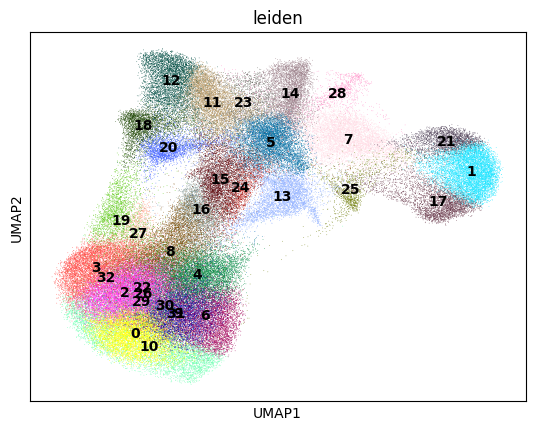

In [13]:
sc.pl.umap(adata, color=['leiden'], legend_loc='on data')

In [32]:
mapping = {
    'T cell': [5],
    'Macrophage': [14, 23],
    'Epithelial': [19, 27, 8, 4, 6, 32, 30, 29, 26, 22, 2, 32, 3, 0, 10, 9, 31],
    'Endothelial': [20],
    'Fibroblast': [12, 18, 11],
    'Hepatocyte': [1, 17, 21, 7],
    'Cholangiocyte': [25],
    'Plasma': [28],
    'Unlabeled': [16, 15, 24, 13],
}


r_mapping = {v:k for k, vs in mapping.items() for v in vs}
adata.obs['cell_type'] = [r_mapping.get(int(x), f'cluster {x}') for x in adata.obs['leiden'].to_list()]

... storing 'cell_type' as categorical
... storing 'cell_type_specific' as categorical
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


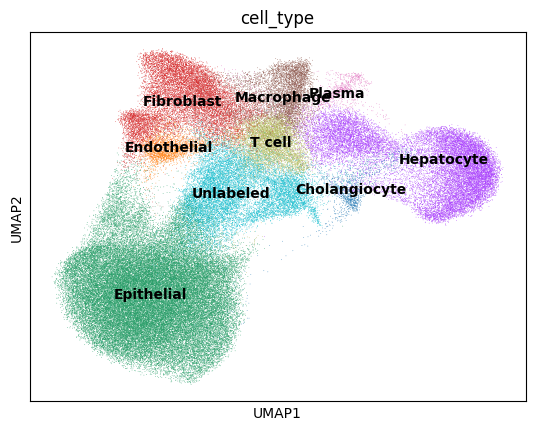

In [33]:
sc.pl.umap(adata, color=['cell_type'], legend_loc='on data')

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


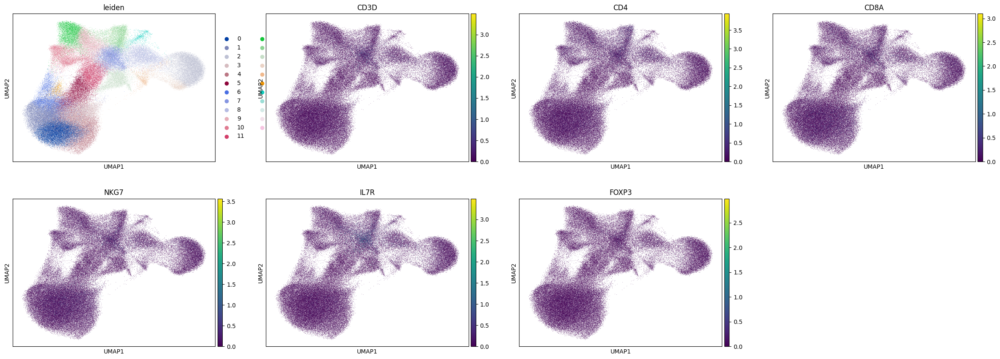

In [19]:
sc.pl.umap(adata, color=['leiden', 'CD3D', 'CD4', 'CD8A', 'NKG7', 'IL7R', 'FOXP3'])

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


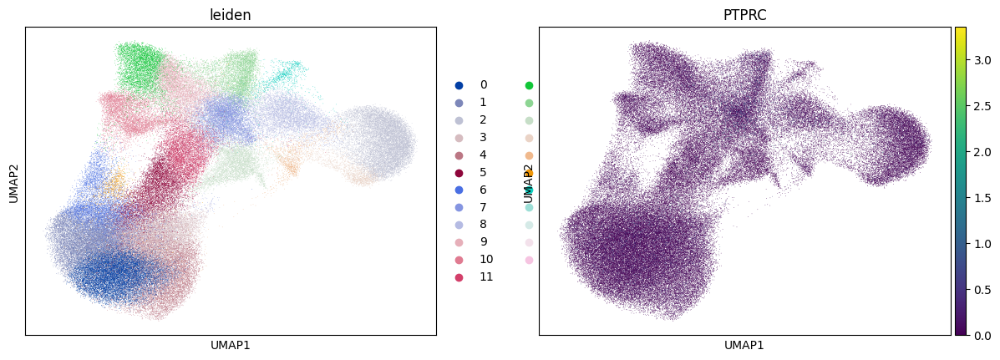

In [40]:
sc.pl.umap(adata, color=['leiden', 'PTPRC'])

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


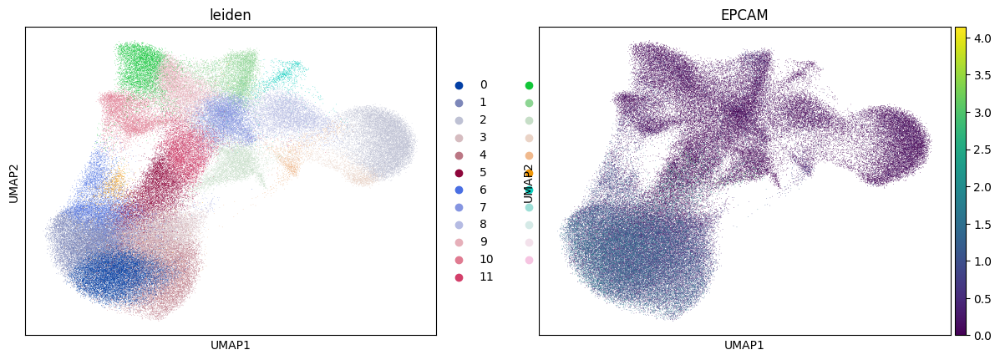

In [20]:
sc.pl.umap(adata, color=['leiden', 'EPCAM'])

In [33]:
[x for x in adata.var.index if 'APO' in x]

['APOA1', 'APOC1', 'APOD', 'APOE']

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


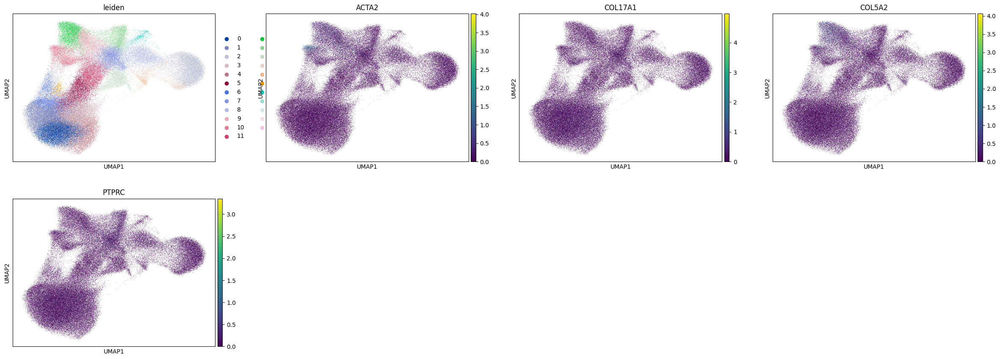

In [22]:
# sc.pl.umap(adata, color=['leiden', 'ACTA2', 'FN1', 'PDPN', 'VIM', 'COL17A1', 'COL5A2'])
sc.pl.umap(adata, color=['leiden', 'ACTA2', 'COL17A1', 'COL5A2', 'PTPRC'])

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


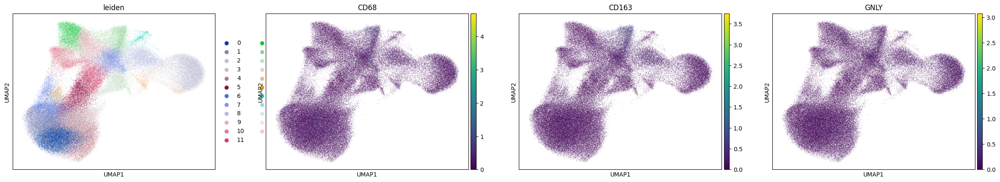

In [23]:
sc.pl.umap(adata, color=['leiden', 'CD68', 'CD163', 'GNLY'])

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


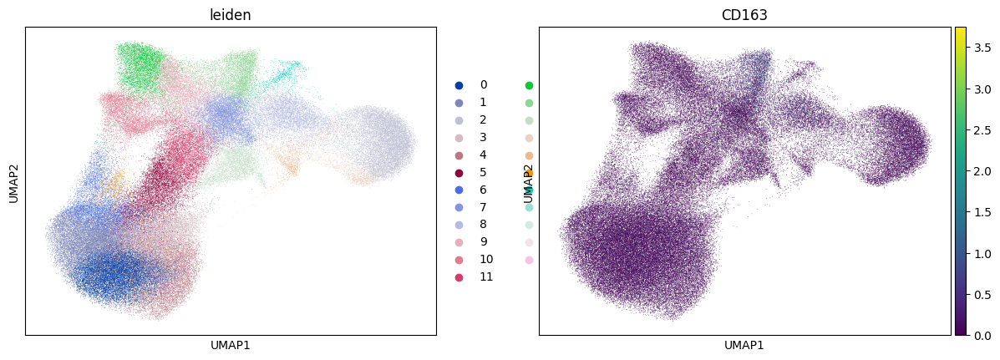

In [39]:
sc.pl.umap(adata, color=['leiden', 'CD163'])

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


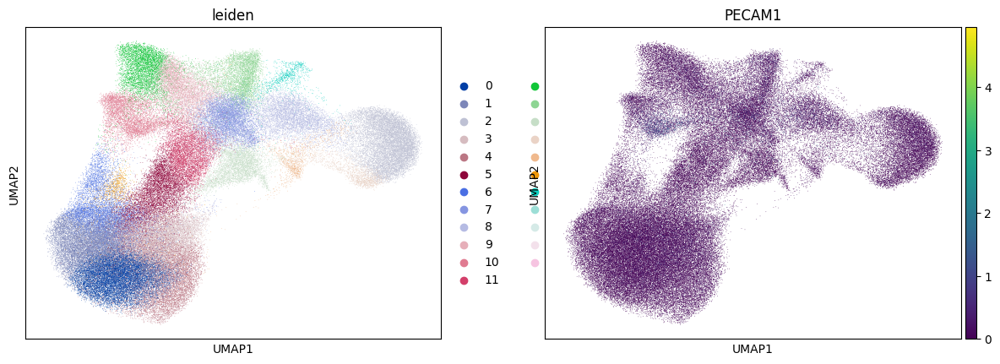

In [24]:
sc.pl.umap(adata, color=['leiden', 'PECAM1'])

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


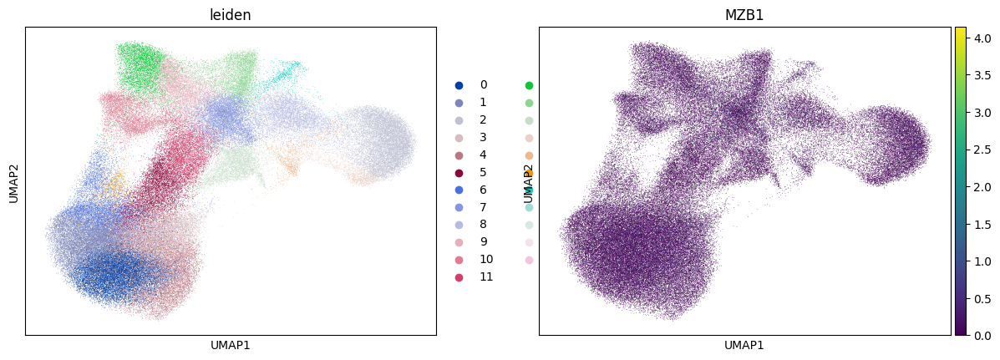

In [69]:
sc.pl.umap(adata, color=['leiden', 'MZB1'])

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


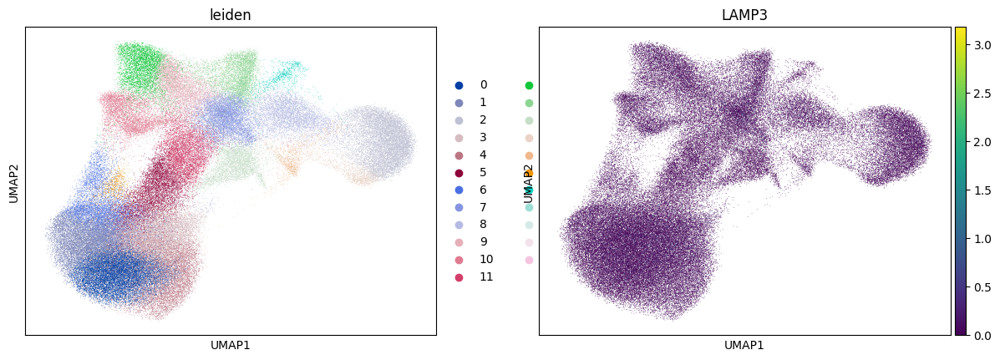

In [26]:
sc.pl.umap(adata, color=['leiden', 'LAMP3'])

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


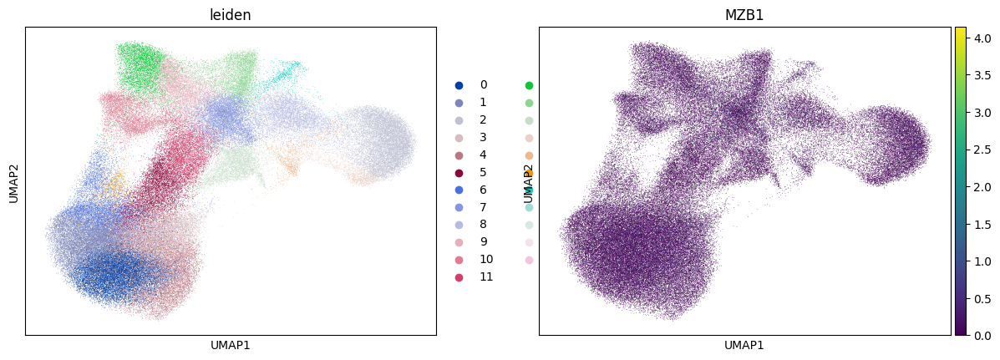

In [27]:
sc.pl.umap(adata, color=['leiden', 'MZB1'])

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


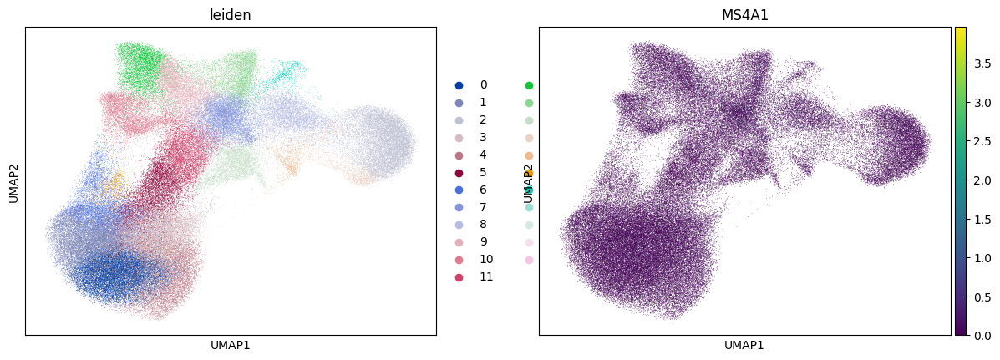

In [28]:
sc.pl.umap(adata, color=['leiden', 'MS4A1'])

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


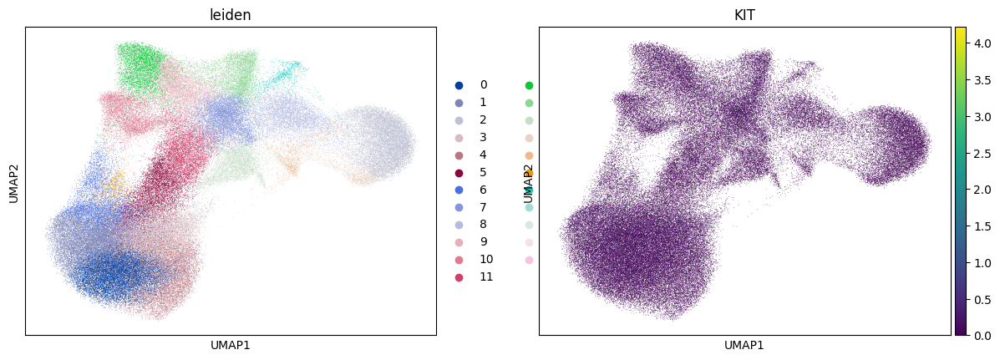

In [29]:
sc.pl.umap(adata, color=['leiden', 'KIT'])

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


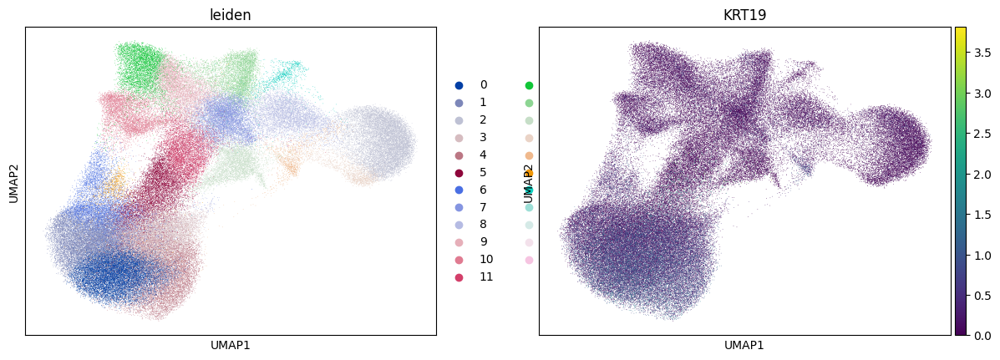

In [66]:
sc.pl.umap(adata, color=['leiden', 'KRT19'])

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


KeyError: 'Could not find key CXCL6 in .var_names or .obs.columns.'

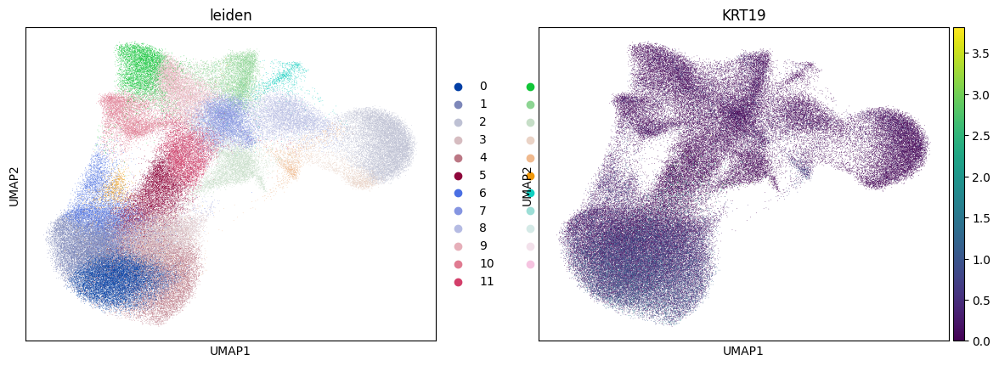

In [68]:
sc.pl.umap(adata, color=['leiden', 'KRT19', 'CXCL6'])

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


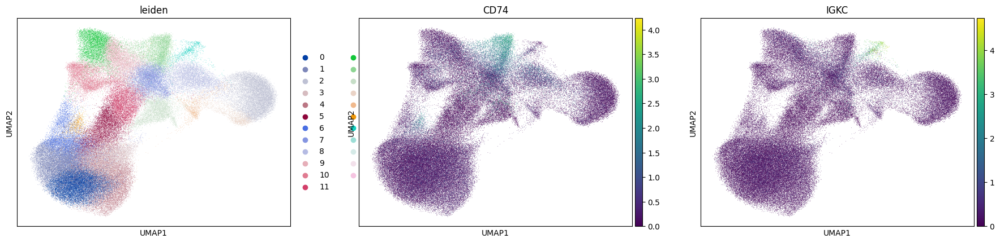

In [65]:
sc.pl.umap(adata, color=['leiden', 'CD74', 'IGKC'])

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


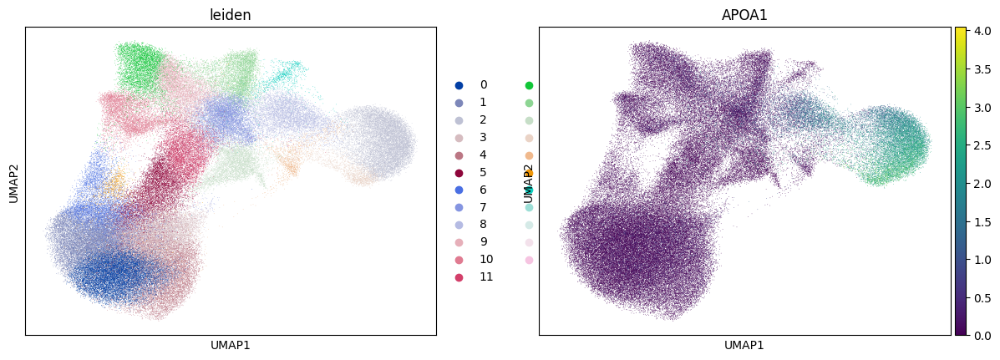

In [34]:
sc.pl.umap(adata, color=['leiden', 'APOA1'])

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


KeyError: 'Could not find key CXCL6 in .var_names or .obs.columns.'

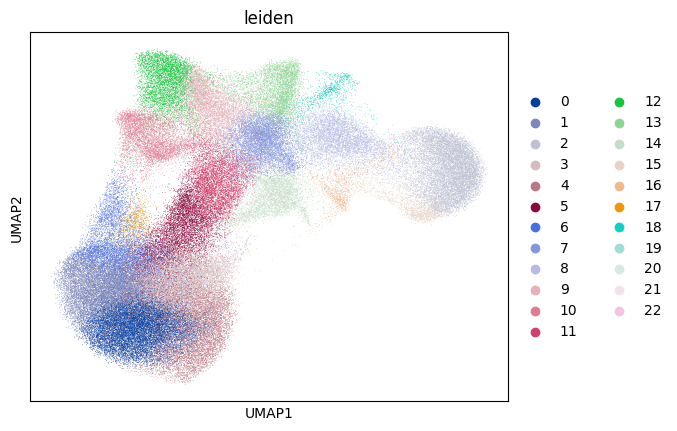

In [36]:
sc.pl.umap(adata, color=['leiden', 'CXCL6', 'SPP1', 'CRP'])

In [26]:
sc.tl.rank_genes_groups(adata, groupby='leiden')

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:398: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


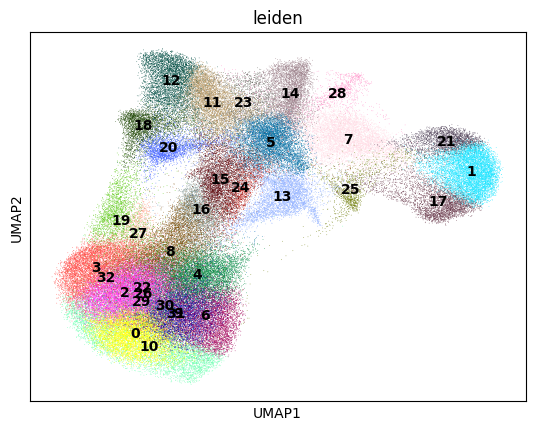

In [27]:
sc.pl.umap(adata, color=['leiden'], legend_loc='on data')

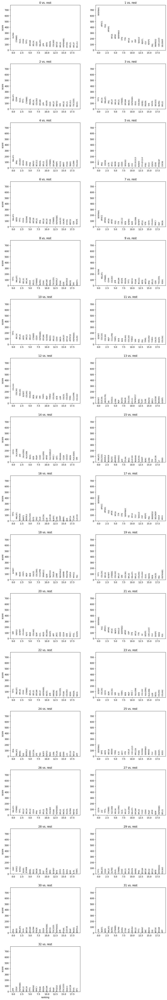

In [28]:
sc.pl.rank_genes_groups(adata, ncols=2)

In [34]:
adata.obs['cell_type_specific'] = adata.obs['cell_type'].to_list()

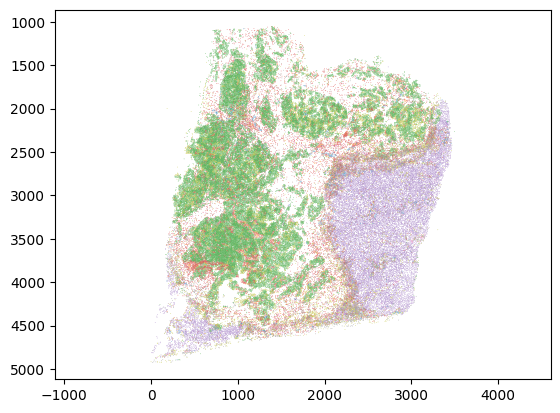

<Axes: >

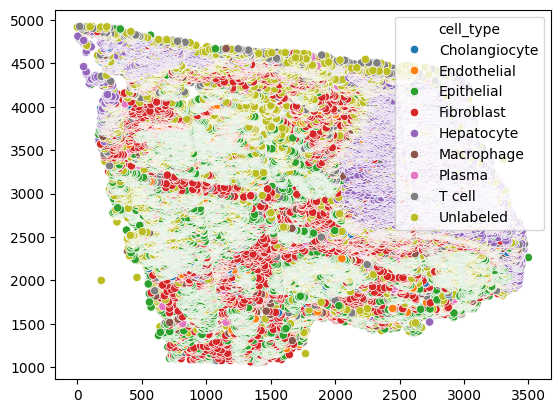

In [35]:
sns.scatterplot(adata.obs, x=adata.obsm['spatial'][:, 0], y=adata.obsm['spatial'][:, 1], hue='cell_type', s=.2, legend=None)
plt.gca().invert_yaxis()
plt.axis('equal')
plt.show()

sns.scatterplot(adata.obs, x=adata.obsm['spatial'][:, 0], y=adata.obsm['spatial'][:, 1], hue='cell_type')




(3000.0, 4000.0)

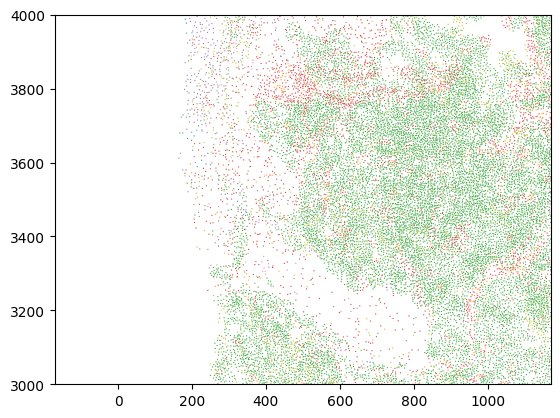

In [36]:
r1, r2, c1, c2 = 3000, 4000, 0, 1000
sns.scatterplot(adata.obs, x=adata.obsm['spatial'][:, 0], y=adata.obsm['spatial'][:, 1], hue='cell_type', s=.8, legend=None)
plt.gca().invert_yaxis()
plt.axis('equal')
plt.xlim((c1, c2))
plt.ylim((r1, r2))

In [37]:
# # save barcodes for test overlay
# f = adata[adata.obs['sid']=='HT413C1-Th1k4A1-U36']
# df = f.obs[['cell_type']].copy()
# df.index = [x.split('_')[-1] for x in df.index.to_list()]
# df.index.name = 'cell_id'
# df.columns = ['group']
# df


In [38]:
# df.to_csv('/data/estorrs/sandbox/HT413C1-Th1k4A1-U36_celltypes.csv')

In [39]:
# save barcodes
df = adata.obs[['sid', 'cell_type_specific']].copy()
df['barcode'] = [x.split('_')[-1] for x in df.index.to_list()]
df.index.name = 'cell_id'
df.to_csv(os.path.join(output_dir, 'cosmx_cell_types.txt'), sep='\t')

In [40]:
df

,sid,cell_type_specific,barcode
cell_id,,,
HT413C1-Th1k4A1-U7_c_1_44_2,HT413C1-Th1k4A1-U7,Epithelial,2
HT413C1-Th1k4A1-U7_c_1_44_3,HT413C1-Th1k4A1-U7,Epithelial,3
HT413C1-Th1k4A1-U7_c_1_44_4,HT413C1-Th1k4A1-U7,Epithelial,4
HT413C1-Th1k4A1-U7_c_1_44_5,HT413C1-Th1k4A1-U7,Unlabeled,5
HT413C1-Th1k4A1-U7_c_1_44_6,HT413C1-Th1k4A1-U7,Cholangiocyte,6
...,...,...,...
HT413C1-Th1k4A1-U34_c_1_43_257,HT413C1-Th1k4A1-U34,Unlabeled,257
HT413C1-Th1k4A1-U34_c_1_43_258,HT413C1-Th1k4A1-U34,Unlabeled,258
HT413C1-Th1k4A1-U34_c_1_43_259,HT413C1-Th1k4A1-U34,T cell,259


In [41]:
set(df['cell_type_specific'])

{'Cholangiocyte',
 'Endothelial',
 'Epithelial',
 'Fibroblast',
 'Hepatocyte',
 'Macrophage',
 'Plasma',
 'T cell',
 'Unlabeled'}

In [42]:
# save object
adata.write_h5ad(os.path.join(output_dir, 'cell_typing_obj.h5ad'))

... storing 'cell_type_specific' as categorical
